## import packages

In [1]:
# region import packages
%matplotlib inline
# management
import glob
import pickle
import warnings
warnings.filterwarnings('ignore')
import os
import sys  # print(sys.path)
sys.path.append('/work/ollie/qigao001')

# data analysis
import numpy as np
import xarray as xr
import dask
dask.config.set({"array.slicing.split_large_chunks": True})
from dask.diagnostics import ProgressBar
pbar = ProgressBar()
pbar.register()
from scipy import stats
import xesmf as xe
import pandas as pd
from metpy.interpolate import cross_section

# plot
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
from matplotlib import cm
import cartopy.crs as ccrs
plt.rcParams['pcolor.shading'] = 'auto'
mpl.rcParams['figure.dpi'] = 600
mpl.rc('font', family='Times New Roman', size=10)
mpl.rcParams['axes.linewidth'] = 0.2
plt.rcParams.update({"mathtext.fontset": "stix"})
import matplotlib.animation as animation
import seaborn as sns

# self defined
from a_basic_analysis.b_module.mapplot import (
    globe_plot,
    hemisphere_plot,
    quick_var_plot,
    mesh2plot,
    framework_plot1,
    remove_trailing_zero,
)

from a_basic_analysis.b_module.basic_calculations import (
    mon_sea_ann,
)

from a_basic_analysis.b_module.namelist import (
    month,
    month_num,
    month_dec,
    month_dec_num,
    seasons,
    seasons_last_num,
    hours,
    months,
    month_days,
    zerok,
)

from a_basic_analysis.b_module.source_properties import (
    source_properties,
    calc_lon_diff,
)

# endregion


In [11]:
os.chdir('/work/ollie/qigao001')

## import data

In [12]:
# region import pre_weighted_lat

pre_weighted_lat = {}

expid = [
    'pi_m_416_4.9',
    'lig_m_000_4.9',
    'lgm_m_000_4.9',
]

exp_odir = [
    'output/echam-6.3.05p2-wiso/pi/',
    'output/echam-6.3.05p2-wiso/lig/',
    'output/echam-6.3.05p2-wiso/lgm/',
]

for i in range(len(expid)):
    # i = 0
    with open(exp_odir[i] + expid[i] + '/analysis/echam/' + expid[i] + '.pre_weighted_lat.pkl', 'rb') as f:
        pre_weighted_lat[expid[i]] = pickle.load(f)

    print(exp_odir[i] + '    ' + expid[i])


'''
'''
# endregion


output/echam-6.3.05p2-wiso/pi/    pi_m_416_4.9
output/echam-6.3.05p2-wiso/lig/    lig_m_000_4.9
output/echam-6.3.05p2-wiso/lgm/    lgm_m_000_4.9


'\n'

## plot am_sm pre_weighted_lat

i = 0
i = 1
i = 2


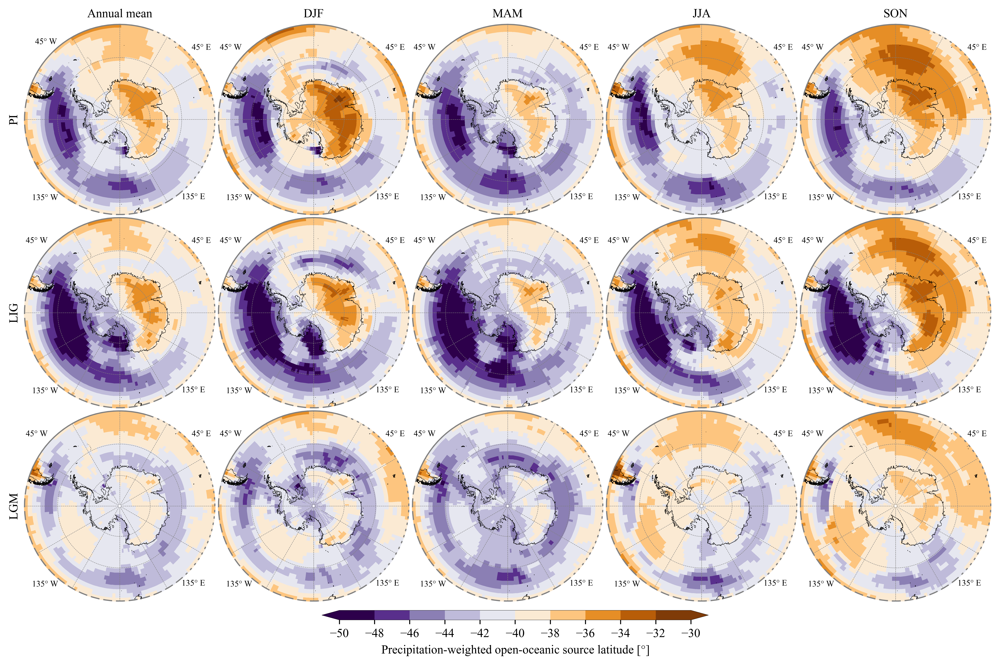

In [14]:
# region plot am_sm pre_weighted_lat

#-------- basic set

lon = pre_weighted_lat[expid[0]]['am'].lon
lat = pre_weighted_lat[expid[0]]['am'].lat


#-------- plot configuration
# output_png = 'figures/6_awi/6.1_echam6/6.1.3_source_var/6.1.3.0_lat/' + '6.1.3.0 pi_lig_lgm ' + expid[0] + ' ' + expid[1] + ' ' + expid[2] + ' pre_weighted_lat am_sm Antarctica.png'
cbar_label1 = 'Precipitation-weighted open-oceanic source latitude [$°$]'
cbar_label2 = 'Differences in precipitation-weighted open-oceanic source latitude [$°$]'

pltlevel = np.arange(-50, -30 + 1e-4, 2)
pltticks = np.arange(-50, -30 + 1e-4, 2)
pltnorm = BoundaryNorm(pltlevel, ncolors=len(pltlevel)-1, clip=True)
pltcmp = cm.get_cmap('PuOr', len(pltlevel)-1).reversed()


# pltlevel2 = np.arange(-10, 10 + 1e-4, 2)
# pltticks2 = np.arange(-10, 10 + 1e-4, 2)
# pltnorm2 = BoundaryNorm(pltlevel2, ncolors=len(pltlevel2)-1, clip=True)
# pltcmp2 = cm.get_cmap('PiYG', len(pltlevel2)-1).reversed()

ctr_level = np.array([1, 2, 3, 4, 5, ])

nrow = 3
ncol = 5
fm_bottom = 2 / (5.8*nrow + 2)

fig, axs = plt.subplots(
    nrow, ncol, figsize=np.array([5.8*ncol, 5.8*nrow + 2]) / 2.54,
    subplot_kw={'projection': ccrs.SouthPolarStereo()},
    gridspec_kw={'hspace': 0.01, 'wspace': 0.01},)

for irow in range(nrow):
    for jcol in range(ncol):
        axs[irow, jcol] = hemisphere_plot(northextent=-45, ax_org = axs[irow, jcol])

for i in range(len(expid)):
    #-------- am
    print('i = ' + str(i))
    plt_mesh1 = axs[i, 0].pcolormesh(
        lon, lat, pre_weighted_lat[expid[i]]['am'],
        norm=pltnorm, cmap=pltcmp,transform=ccrs.PlateCarree(),)
    # plt_ctr1 = axs[i, 0].contour(
    #     lon, lat.sel(lat=slice(-45, -90)),
    #     pre_weighted_lat[expid[i]]['ann'].std(
    #         dim='time', skipna=True).sel(lat=slice(-45, -90)),
    #     levels=ctr_level, colors = 'b', transform=ccrs.PlateCarree(),
    #     linewidths=0.5, linestyles='solid',
    # )
    # axs[i, 0].clabel(plt_ctr1, inline=1, colors='b', fmt=remove_trailing_zero,
    #                  levels=ctr_level, inline_spacing=10, fontsize=7,)
    
    #-------- sm
    for iseason in range(len(seasons)):
        axs[i, iseason + 1].pcolormesh(
            lon, lat,
            pre_weighted_lat[expid[i]]['sm'].sel(season=seasons[iseason]),
            norm=pltnorm, cmap=pltcmp,transform=ccrs.PlateCarree(),)
        # plt_ctr2 = axs[i, iseason + 1].contour(
        #     lon, lat.sel(lat=slice(-45, -90)),
        #     pre_weighted_lat[expid[i]]['sea'].sel(
        #         time=(pre_weighted_lat[expid[i]]['sea'].time.dt.month == \
        #             seasons_last_num[iseason])
        #         ).std(dim='time', skipna=True).sel(lat=slice(-45, -90)),
        #     levels=ctr_level, colors = 'b', transform=ccrs.PlateCarree(),
        #     linewidths=0.5, linestyles='solid',
        # )
        # axs[i, iseason + 1].clabel(
        #     plt_ctr2, inline=1, colors='b', fmt=remove_trailing_zero,
        #     levels=ctr_level, inline_spacing=10, fontsize=7,)

plt.text(
    0.5, 1.05, 'Annual mean', transform=axs[0, 0].transAxes,
    ha='center', va='center', rotation='horizontal')

for iseason in range(len(seasons)):
    plt.text(
        0.5, 1.05, seasons[iseason], transform=axs[0, 1 + iseason].transAxes,
        ha='center', va='center', rotation='horizontal')

plt.text(
    -0.05, 0.5, 'PI', transform=axs[0, 0].transAxes,
    ha='center', va='center', rotation='vertical')
plt.text(
    -0.05, 0.5, 'LIG', transform=axs[1, 0].transAxes,
    ha='center', va='center', rotation='vertical')
plt.text(
    -0.05, 0.5, 'LGM', transform=axs[2, 0].transAxes,
    ha='center', va='center', rotation='vertical')

cbar1 = fig.colorbar(
    cm.ScalarMappable(norm=pltnorm, cmap=pltcmp), ax=axs,
    orientation="horizontal",shrink=0.5,aspect=40,extend='both',
    anchor=(0.5, -0.5), ticks=pltticks)
cbar1.ax.set_xlabel(cbar_label1, linespacing=2)

# cbar2 = fig.colorbar(
#     cm.ScalarMappable(norm=pltnorm2, cmap=pltcmp2), ax=axs,
#     orientation="horizontal",shrink=0.5,aspect=40,extend='both',
#     anchor=(1.1,-4.3),ticks=pltticks2)
# cbar2.ax.set_xlabel(cbar_label2, linespacing=2)

fig.subplots_adjust(left=0.02, right = 0.99, bottom = fm_bottom, top = 0.97)
# fig.savefig(output_png)

# endregion


## plot am_sm diff pre_weighted_lat

i = 1
i = 2


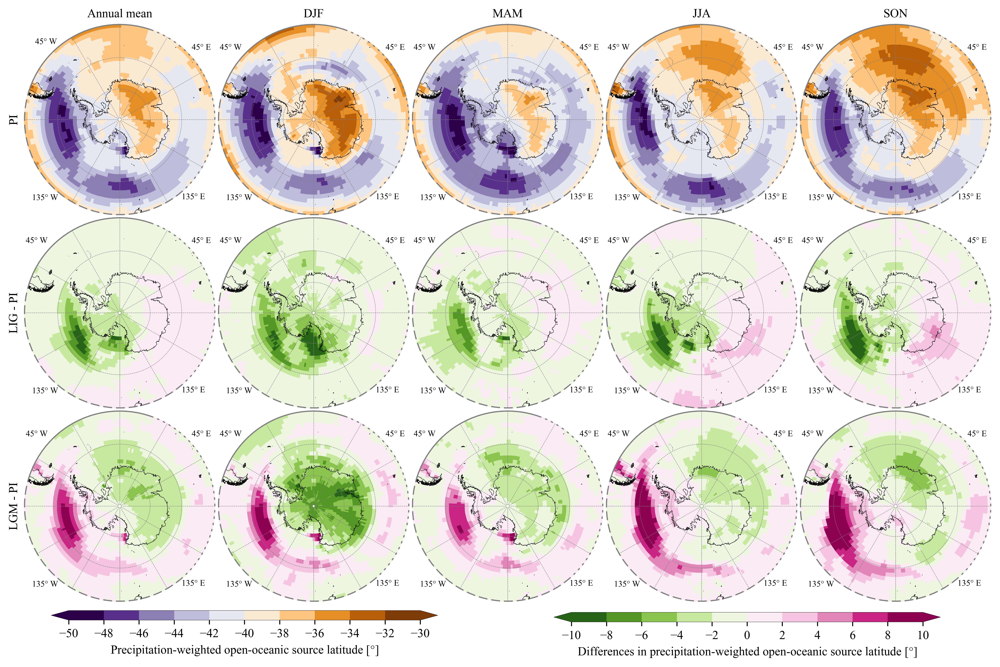

In [15]:
# region plot am_sm diff pre_weighted_lat

#-------- basic set

lon = pre_weighted_lat[expid[0]]['am'].lon
lat = pre_weighted_lat[expid[0]]['am'].lat


#-------- plot configuration
output_png = 'figures/6_awi/6.1_echam6/6.1.3_source_var/6.1.3.0_lat/' + '6.1.3.0 pi_lig_lgm ' + expid[0] + ' ' + expid[1] + ' ' + expid[2] + ' pre_weighted_lat am_sm diff Antarctica.png'
cbar_label1 = 'Precipitation-weighted open-oceanic source latitude [$°$]'
cbar_label2 = 'Differences in precipitation-weighted open-oceanic source latitude [$°$]'

pltlevel = np.arange(-50, -30 + 1e-4, 2)
pltticks = np.arange(-50, -30 + 1e-4, 2)
pltnorm = BoundaryNorm(pltlevel, ncolors=len(pltlevel)-1, clip=True)
pltcmp = cm.get_cmap('PuOr', len(pltlevel)-1).reversed()


pltlevel2 = np.arange(-10, 10 + 1e-4, 2)
pltticks2 = np.arange(-10, 10 + 1e-4, 2)
pltnorm2 = BoundaryNorm(pltlevel2, ncolors=len(pltlevel2)-1, clip=True)
pltcmp2 = cm.get_cmap('PiYG', len(pltlevel2)-1).reversed()

ctr_level = np.array([1, 2, 3, 4, 5, ])

nrow = 3
ncol = 5
fm_bottom = 2 / (5.8*nrow + 2)

fig, axs = plt.subplots(
    nrow, ncol, figsize=np.array([5.8*ncol, 5.8*nrow + 2]) / 2.54,
    subplot_kw={'projection': ccrs.SouthPolarStereo()},
    gridspec_kw={'hspace': 0.01, 'wspace': 0.01},)

for irow in range(nrow):
    for jcol in range(ncol):
        axs[irow, jcol] = hemisphere_plot(northextent=-45, ax_org = axs[irow, jcol])

i = 0
plt_mesh1 = axs[i, 0].pcolormesh(
    lon, lat, pre_weighted_lat[expid[i]]['am'],
    norm=pltnorm, cmap=pltcmp,transform=ccrs.PlateCarree(),)
# plt_ctr1 = axs[i, 0].contour(
#     lon, lat.sel(lat=slice(-45, -90)),
#     pre_weighted_lat[expid[i]]['ann'].std(
#         dim='time', skipna=True).sel(lat=slice(-45, -90)),
#     levels=ctr_level, colors = 'b', transform=ccrs.PlateCarree(),
#     linewidths=0.5, linestyles='solid',
# )
# axs[i, 0].clabel(plt_ctr1, inline=1, colors='b', fmt=remove_trailing_zero,
#                  levels=ctr_level, inline_spacing=10, fontsize=7,)

#-------- sm
for iseason in range(len(seasons)):
    axs[i, iseason + 1].pcolormesh(
        lon, lat,
        pre_weighted_lat[expid[i]]['sm'].sel(season=seasons[iseason]),
        norm=pltnorm, cmap=pltcmp,transform=ccrs.PlateCarree(),)
    # plt_ctr2 = axs[i, iseason + 1].contour(
    #     lon, lat.sel(lat=slice(-45, -90)),
    #     pre_weighted_lat[expid[i]]['sea'].sel(
    #         time=(pre_weighted_lat[expid[i]]['sea'].time.dt.month == \
    #             seasons_last_num[iseason])
    #         ).std(dim='time', skipna=True).sel(lat=slice(-45, -90)),
    #     levels=ctr_level, colors = 'b', transform=ccrs.PlateCarree(),
    #     linewidths=0.5, linestyles='solid',
    # )
    # axs[i, iseason + 1].clabel(
    #     plt_ctr2, inline=1, colors='b', fmt=remove_trailing_zero,
    #     levels=ctr_level, inline_spacing=10, fontsize=7,)


for i in np.arange(1, len(expid)):
    #-------- am
    print('i = ' + str(i))
    plt_mesh1 = axs[i, 0].pcolormesh(
        lon, lat,
        pre_weighted_lat[expid[i]]['am'] - pre_weighted_lat[expid[0]]['am'],
        norm=pltnorm2, cmap=pltcmp2, transform=ccrs.PlateCarree(),)
    
    #-------- sm
    for iseason in range(len(seasons)):
        axs[i, iseason + 1].pcolormesh(
            lon, lat,
            pre_weighted_lat[expid[i]]['sm'].sel(season=seasons[iseason]) - \
                pre_weighted_lat[expid[0]]['sm'].sel(season=seasons[iseason]),
            norm=pltnorm2, cmap=pltcmp2,transform=ccrs.PlateCarree(),)

plt.text(
    0.5, 1.05, 'Annual mean', transform=axs[0, 0].transAxes,
    ha='center', va='center', rotation='horizontal')

for iseason in range(len(seasons)):
    plt.text(
        0.5, 1.05, seasons[iseason], transform=axs[0, 1 + iseason].transAxes,
        ha='center', va='center', rotation='horizontal')

plt.text(
    -0.05, 0.5, 'PI', transform=axs[0, 0].transAxes,
    ha='center', va='center', rotation='vertical')
plt.text(
    -0.05, 0.5, 'LIG - PI', transform=axs[1, 0].transAxes,
    ha='center', va='center', rotation='vertical')
plt.text(
    -0.05, 0.5, 'LGM - PI', transform=axs[2, 0].transAxes,
    ha='center', va='center', rotation='vertical')

cbar1 = fig.colorbar(
    cm.ScalarMappable(norm=pltnorm, cmap=pltcmp), ax=axs,
    orientation="horizontal",shrink=0.5,aspect=40,extend='both',
    anchor=(-0.2, -0.5), ticks=pltticks)
cbar1.ax.set_xlabel(cbar_label1, linespacing=2)

cbar2 = fig.colorbar(
    cm.ScalarMappable(norm=pltnorm2, cmap=pltcmp2), ax=axs,
    orientation="horizontal",shrink=0.5,aspect=40,extend='both',
    anchor=(1.1,-4.3),ticks=pltticks2)
cbar2.ax.set_xlabel(cbar_label2, linespacing=2)

fig.subplots_adjust(left=0.02, right = 0.99, bottom = fm_bottom, top = 0.97)
fig.savefig(output_png)

# endregion
